In [1]:
suppressPackageStartupMessages({
    
    library(APL)
    library(CAbiNet)

    library(SingleCellExperiment)
    library(scater)
    library(scuttle)
    library(scran)

    library(tidyverse)
    library(plotly)
    library(ggrepel)
    library(ggthemes)
    
    library(ComplexHeatmap)
    library(circlize)
    library(ggsankey)
    library(dittoSeq)
    
})



dir <- "./"

# Uncomment if you want to save results:

#resdir <- file.path(dir,"tabula_muris_results", "res")
#imgdir <- file.path(dir,"tabula_muris_results", "img")

#dir.create(resdir, recursive = TRUE)
#dir.create(imgdir, recursive = TRUE)

options(repr.plot.width = 15, repr.plot.height = 10)
set.seed(2358)


Warning message:
“package ‘CAbiNet’ was built under R version 4.2.2”


In [2]:
marker_genes <- read_csv(file.path("../Data/discussed_data/tabula_muris_marker_genes.csv"))


Rows: 19 Columns: 2
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr (2): cell_type, gene

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


# Pre-processing & QC

Either load the preprocessed data or re-run the preprocessing. 

If you prefer to pre-process the data yourself, please use the scripts in `./Data/download_raw_data_scripts/tabula_muris/` to download the data and run the preprocessing as follows:

First run `tabula_muris_save_RAW_data.R` to download the data. 
Afterwards run `Preprocessing/run_preprocessing_tabula_muris.sh` to pre-process the data. 

It might be necessary to change some of the input/output directories in the scripts depending on your system.
Using the output of `run_preprocessing_tabula_muris.sh`, you can follow the remainder of the analysis below.


To skip the pre-processing load the *_preprocessed.rds file.

In [3]:
# pre-processed data:
sce <- readRDS(file.path('../Data/discussed_data/preprocessed/tabula_muris_preprocessed_filtered.rds'))


## Feature selection

In [4]:
genevars <- modelGeneVar(sce, assay.type = "logcounts")
chosen <- getTopHVGs(genevars, n = 6000, var.threshold = NULL)

#add marker_genes
expr_markers <- marker_genes[marker_genes$gene %in% rownames(sce),]
chosen <- c(chosen, expr_markers$gene)
chosen <- unique(chosen)
sce_sub <- sce[chosen,]

In [5]:
#saveRDS(sce_sub, file.path(resdir, "sce_sub.rds"))

# CAbiNet

## Correspondence analysis

In [6]:
ca <- cacomp(obj = logcounts(sce_sub),
             princ_coords = 3,
             dims = 30, 
             top = nrow(sce_sub),
             residuals = "pearson",
             python = TRUE)

In [7]:
#saveRDS(ca, file.path(resdir, "cacomp.rds"))

## CAbiNet clustering

In [8]:
cabic <-  caclust(ca, 
                  k = c(60, 30, 60, 60),
                  resolution = 1,
                  loops = FALSE,
                  SNN_prune = 1/15,
                  mode = "all",
                  select_genes = TRUE,
                  prune_overlap = TRUE,
                  overlap = 0.2,
                  calc_gene_cell_kNN = FALSE,
                  algorithm = 'leiden',
                  leiden_pack = 'leiden',
                  marker_genes = marker_genes$gene,
                  rand_seed = 2358)
cabic



Warning message in create_bigraph(caobj = caobj, k_c = k_c, k_g = k_g, k_cg = k_cg, :
“Not all marker genes are in the provided data.”


caclust object with 1882 cells and 1281 genes.
7 clusters found.
Clustering results:

 cluster ncells ngenes
 1       500    326   
 2       453    221   
 3       201    203   
 4       264    104   
 5       231    134   
 6       156    175   
 7        77    118   

In [9]:
#saveRDS(cabic, file.path(resdir, "cabic_unfiltered.rds"))

In [10]:
sce_sub$cabinet_cluster <- cell_clusters(cabic)
ari <- mclust::adjustedRandIndex(cell_clusters(cabic), sce_sub$cell_ontology_class)
round(ari,2)

# Remove monoclusters from results
cabic <- rm_monoclusters(cabic)

[1] 0.78

## Compute the biMAP

In [11]:
cabic <- biMAP(obj = cabic,
               k = 30, 
               rand_seed = 2358, 
               method = "SNNdist")

In [12]:
#saveRDS(cabic, file.path(resdir, "cabic.rds"))

# Suppl. Figure 1

## biMAP - panel a

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


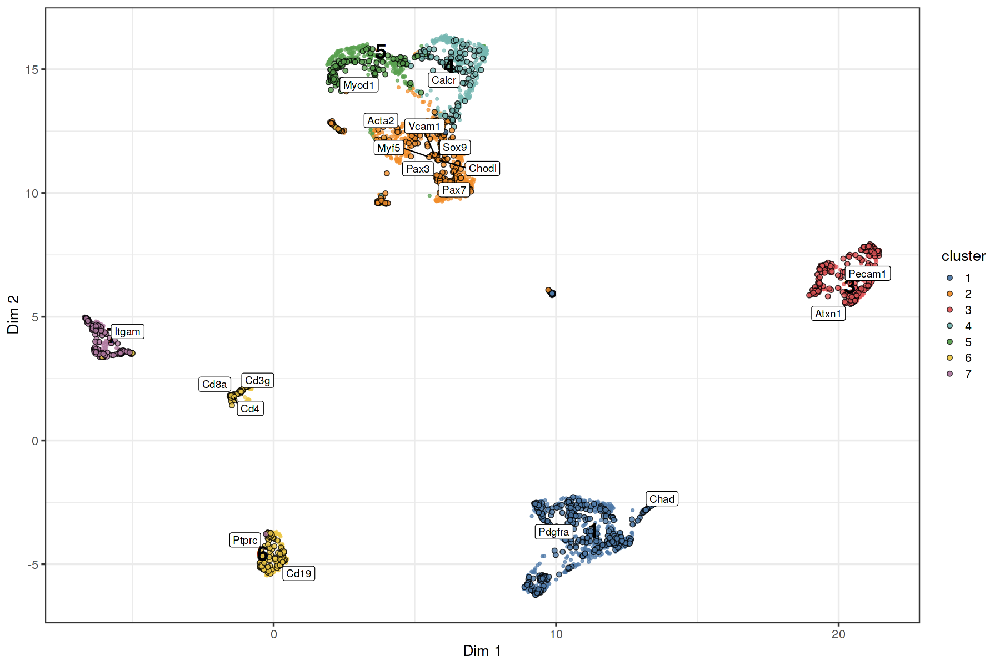

In [13]:

pal <- tableau_color_pal("Tableau 10")

clusters <- unique(c(cell_clusters(cabic), gene_clusters(cabic)))
color_theme <- pal(length(unique(clusters)))
names(color_theme) <- as.character(sort(clusters))

p <- plot_scatter_biMAP(cabic,
                        label_groups = TRUE, 
                        color_genes = TRUE,
                        group_label_size = 8) + 
    scale_color_manual(values = color_theme) +
    scale_fill_manual(values = color_theme) +
    theme_bw(base_size = 16) +
    theme(legend.position = "right",
          panel.background = element_rect(fill='transparent'), 
          plot.background = element_rect(fill='transparent', color=NA),
          legend.background = element_rect(fill='transparent') 
         ) +
geom_label_repel(data = cabic@bimap[cabic@bimap$name %in% c(marker_genes$gene, "Pax3"),],
                     aes(x, y, label=name),
                     color = "black",
                     max.overlaps = Inf) 
p


#ggsave(plot = p, 
#       filename = file.path(imgdir, "scatter_biMAP_clusters_sfig1_panel_a.pdf"),
#       width = 2500,
#       height = 2300,
#       units = "px",
#       bg = "transparent")


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


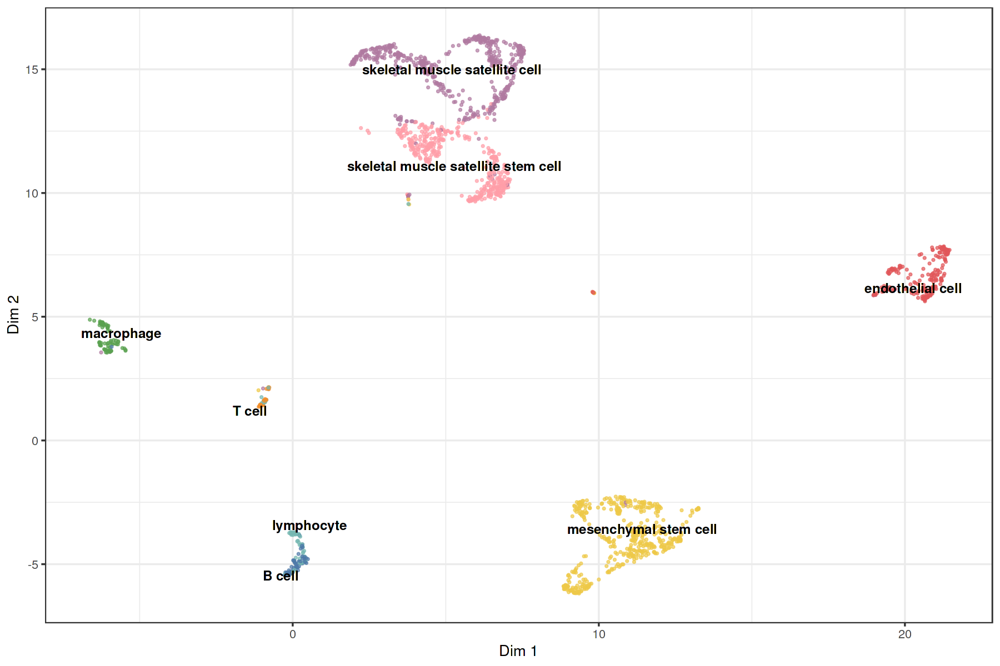

In [14]:
# not included in paper

pal <- tableau_color_pal("Tableau 10")

clusters <- unique(sce_sub$cell_ontology_class)
cols <- pal(length(unique(clusters)))
names(cols) <- as.character(sort(clusters))

p <- plot_scatter_biMAP(obj = cabic, 
                        group_label_size = 5,
                        cell_size = 1, 
                        gene_alpha = 0,
                        label_groups = TRUE, 
                        color_genes = FALSE,
                        meta_df = colData(sce_sub), 
                        color_by = "cell_ontology_class") + 
    scale_color_manual(values = cols) +
    theme_bw(base_size = 16) +
    theme(legend.position = "none",
          panel.background = element_rect(fill='transparent'),
          plot.background = element_rect(fill='transparent', color=NA),
          legend.background = element_rect(fill='transparent')
         )
p

#ggsave(plot = p, 
#       filename = file.path(imgdir, "scatter_biMAP_cell_types.pdf"),
#       width = 2500,
#       height = 2300,
#       units = "px")

## interactive biMAP

### interactive scatter plot

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Warning message in geom2trace.default(dots[[1L]][[1L]], dots[[2L]][[1L]], dots[[3L]][[1L]]):
“geom_GeomTextRepel() has yet to be implemented in plotly.
  If you'd like to see this geom implemented,
  Please open an issue with your example code at
  https://github.com/ropensci/plotly/issues”
Warning message:
“Specifying width/height in layout() is now deprecated.
Please specify in ggplotly() or plot_ly()”


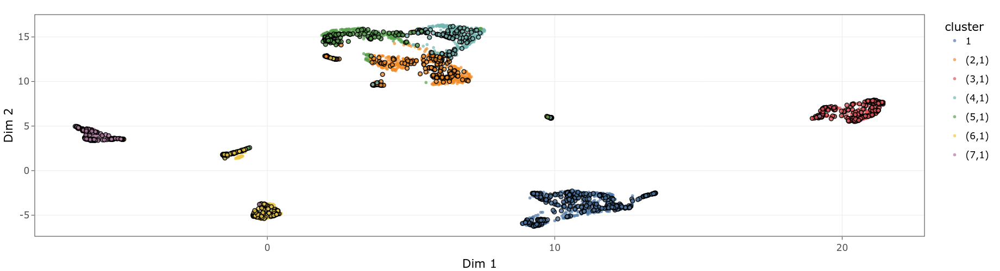

In [15]:

p <- plot_scatter_biMAP(cabic,
                        color_genes = TRUE) + 
    scale_color_manual(values = color_theme) +
    scale_fill_manual(values = color_theme) +
    theme_bw(base_size = 16)

interactive <- ggplotly(p)
interactive %>% layout(autosize = FALSE, width = 700, height = 500)

# htmlwidgets::saveWidget(interactive, file.path(imgdir, "interactive_bimap.html"))

### interactive hex plot

Warning message in geom2trace.default(dots[[1L]][[1L]], dots[[2L]][[1L]], dots[[3L]][[1L]]):
“geom_GeomTextRepel() has yet to be implemented in plotly.
  If you'd like to see this geom implemented,
  Please open an issue with your example code at
  https://github.com/ropensci/plotly/issues”
Warning message:
“Specifying width/height in layout() is now deprecated.
Please specify in ggplotly() or plot_ly()”


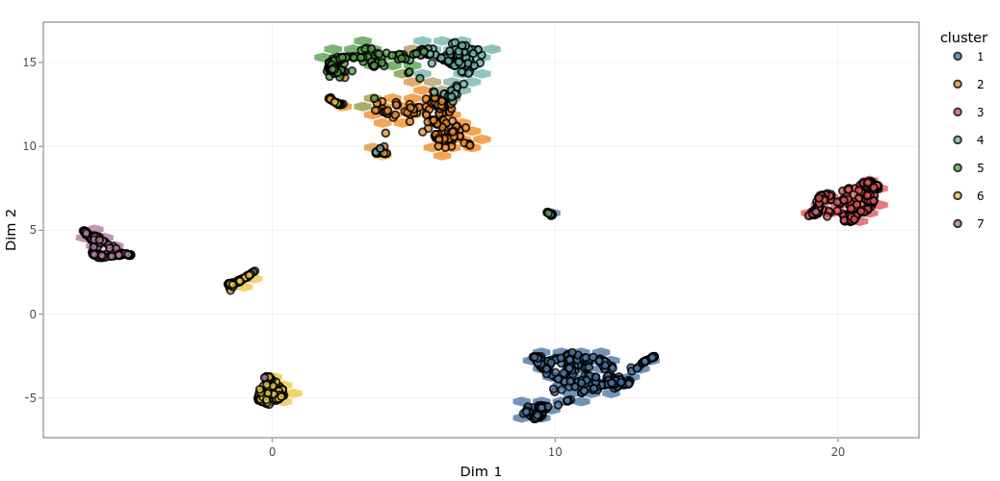

In [16]:

interactive <- plot_hex_biMAP(cabic,
                    color_genes = TRUE,
                    colors = color_theme,
                    interactive = TRUE)

interactive %>% layout(autosize = FALSE, width = 700, height = 500)

# htmlwidgets::saveWidget(interactive, file.path(imgdir, "interactive_hex_bimap.html"))

## Sankey plot - panel b

Warning message:
“attributes are not identical across measure variables;
they will be dropped”
`summarise()` has grouped output by 'Biclusters'. You can override using the `.groups` argument.


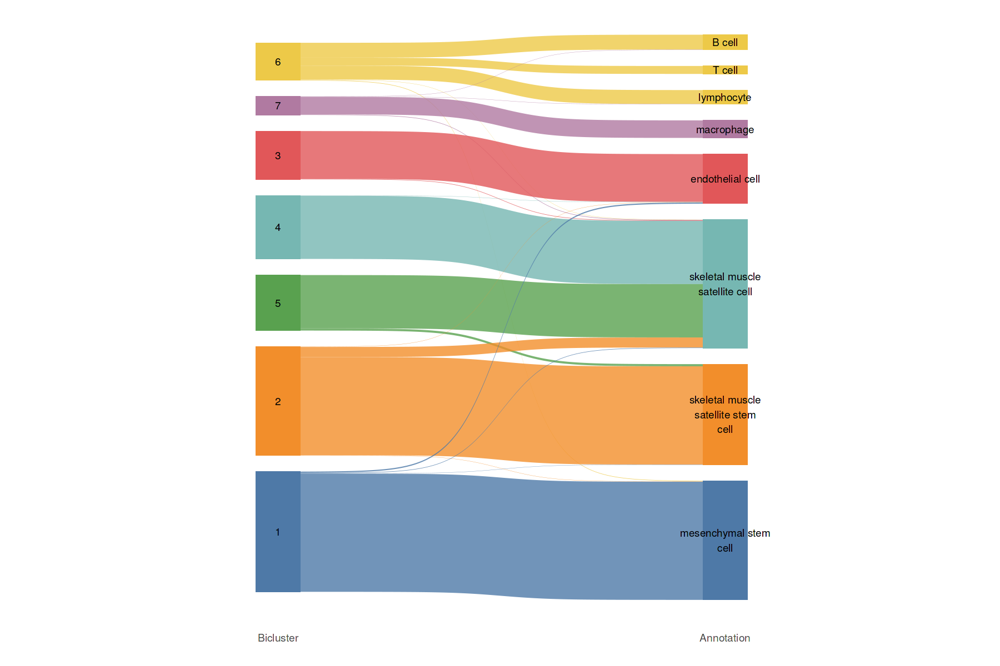

In [17]:
data <- colData(sce_sub) %>%
        as.data.frame() %>%
        rename('Annotation' = "cell_ontology_class",
               'Bicluster' = "cabinet_cluster")

df <- data %>% 
    make_long(Bicluster, Annotation)

info  <-  data.frame(Biclusters = as.factor(data$Bicluster),
                     Truth = as.character(data$Annotation)) %>%  
                as_tibble() %>%
                group_by(Biclusters, Truth) %>% 
                summarise(n = n()) %>%
                group_by(Truth) %>% 
                mutate(Partition = n/sum(n)) %>%
                ungroup() %>% 
                as.data.frame() %>% 
                group_by(Truth) %>%
                filter(Partition == max(Partition) ) %>%
                dplyr::select(Biclusters, Truth) %>%
                distinct(Biclusters, .keep_all = TRUE)


cts <- unique(data$Bicluster)

if (length(cts) > 10){
    tbl_col <- "Tableau 20"
} else {
    tbl_col <- "Tableau 10"
}

pal <- tableau_color_pal(tbl_col)

cols <- color_theme

info <- left_join(data.frame("Biclusters" = names(cols), "col" = cols), info, by = "Biclusters")


cols <- c(cols, info$col)

names(cols) <- c(names(color_theme), info$Truth)


order <- c("mesenchymal stem cell", 
           "skeletal muscle satellite stem cell",
           "skeletal muscle satellite cell",
           "endothelial cell",
           "macrophage",
           "lymphocyte",
           "T cell",
           "B cell",
           "1",
           "2",
           "5",
           "4",
           "3",
           "8",
           "7",
           "6")

wrap <- 17
df$node <- factor(stringr::str_wrap(df$node, wrap), levels = stringr::str_wrap(order, wrap))
df$next_node <- factor(stringr::str_wrap(df$next_node, wrap), levels = stringr::str_wrap(order, wrap))

names(cols) <- stringr::str_wrap(names(cols), wrap)


sank <- ggplot(df, aes(x = x, 
               next_x = next_x, 
               node = node, 
               next_node = next_node,
               fill = node,
               label = as.character(node))) +
  geom_sankey(flow.alpha = 0.8) +
  geom_sankey_text() +
  labs(x = "") +
  scale_fill_manual(values = cols) +
  theme_sankey(base_size = 14) +
  theme(legend.position = "none")

sank

#ggsave(plot = sank, 
#       filename = file.path(imgdir, "sankey_plot_fig1_panel_b.pdf"),
#       width = 2700,
#       height = 2000,
#       units = "px")


## Heatmap - panel c

Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”


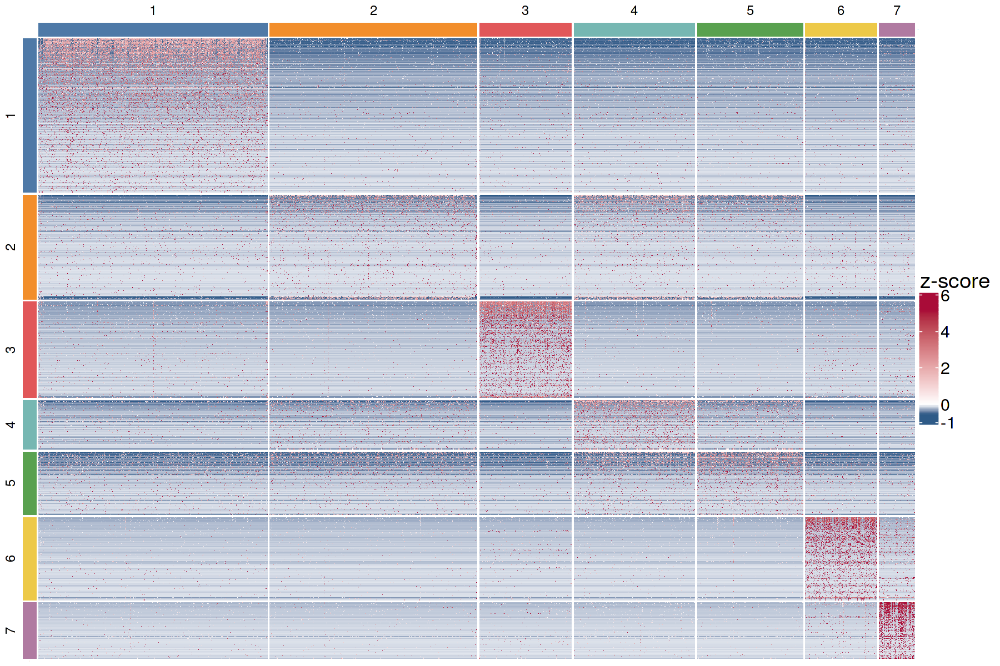

In [18]:

mono_cabic <- cabic

mat <- as.matrix(logcounts(sce_sub[names(gene_clusters(mono_cabic)),names(cell_clusters(mono_cabic))]))

mat  <- (mat - rowMeans(mat))/rowSds(mat)
mat[is.na(mat)] <- 0

clust_order_cells <- c()
un_cc <- sort(unique(cell_clusters(mono_cabic)))
for (i in seq_along(un_cc)){
    clust_order_cells <- c(clust_order_cells, which(cell_clusters(mono_cabic) == un_cc[i]))
}
                           
clust_order_genes <- c()
un_gc <- sort(unique(gene_clusters(mono_cabic)))
for (i in seq_along(un_gc)){
    clust_order_genes <- c(clust_order_genes, which(gene_clusters(mono_cabic) == un_gc[i]))
}                           

mat <- mat[clust_order_genes, clust_order_cells]

ccs <- cell_clusters(mono_cabic)[colnames(mat)]
gcs <- gene_clusters(mono_cabic)[rownames(mat)]

                               
col_fun = colorRamp2(c(quantile(mat,0.01), 0, quantile(mat,0.99)),
                     c("#2E5A87", "white", "#A90C38"))
                               
if (length(un_cc) <= 10){
    pal <- tableau_color_pal("Tableau 10")
} else {
    pal <- tableau_color_pal("Tableau 20")
}

annocol <- pal(length(un_cc))
                               
names(annocol) <- as.character(un_cc)

                               
                               
column_ha = HeatmapAnnotation(cluster = ccs,
                              col = list(cluster = annocol),
                              show_legend = c(FALSE), 
                              annotation_name_gp= gpar(fontsize = 0))


row_ha = rowAnnotation(cluster =  gcs,
                       col = list(cluster = annocol),
                       show_legend = c(FALSE),
                      annotation_name_gp= gpar(fontsize = 0))
breaks <- c(min(-1, quantile(mat,0.01)), 0, 2, 4, max(6, quantile(mat,0.99)))


hm <- Heatmap(mat,
        name = "z-score",
        heatmap_legend_param = list(col_fun = col_fun, 
                                     title = "z-score",
                                     at = breaks,
                                     grid_width = unit(7, "mm"),
                                     legend_height = unit(5, "cm"),
                                     title_gp = gpar(fontsize = 23),
                                     labels_gp = gpar(fontsize = 18)),
        cluster_rows = FALSE,
        cluster_columns = FALSE,
        show_column_names = FALSE,
        cluster_row_slices = FALSE,
        cluster_column_slices = FALSE,
        show_row_names = FALSE,
        row_title_side = "left",
        col = col_fun,
        top_annotation = column_ha,
        left_annotation = row_ha,
        use_raster = FALSE,
    	row_split = gcs,
        column_split = ccs,
        column_title_gp = gpar(fontsize = 14),
        row_title_gp = gpar(fontsize = 14))
                               

hm

#png(file = paste0(imgdir, "/heatmap_sfig1_panel_c.png"),
#    width = 800,
#    height = 600,
#    unit = "px")
#hm
#dev.off()   

## Dotplot - panel d

In [19]:
gois <- c("Pdgfra",
          "Itgam",
          "Cd19",
          "Cd3g",
          "Calcr",
          "Myod1",
          "Pax7",
          "Pax3",
          "Myf5")

New names:
• `` -> `...1`
• `` -> `...2`
• `` -> `...3`
• `` -> `...4`
• `` -> `...5`
• `` -> `...6`
• `` -> `...7`
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


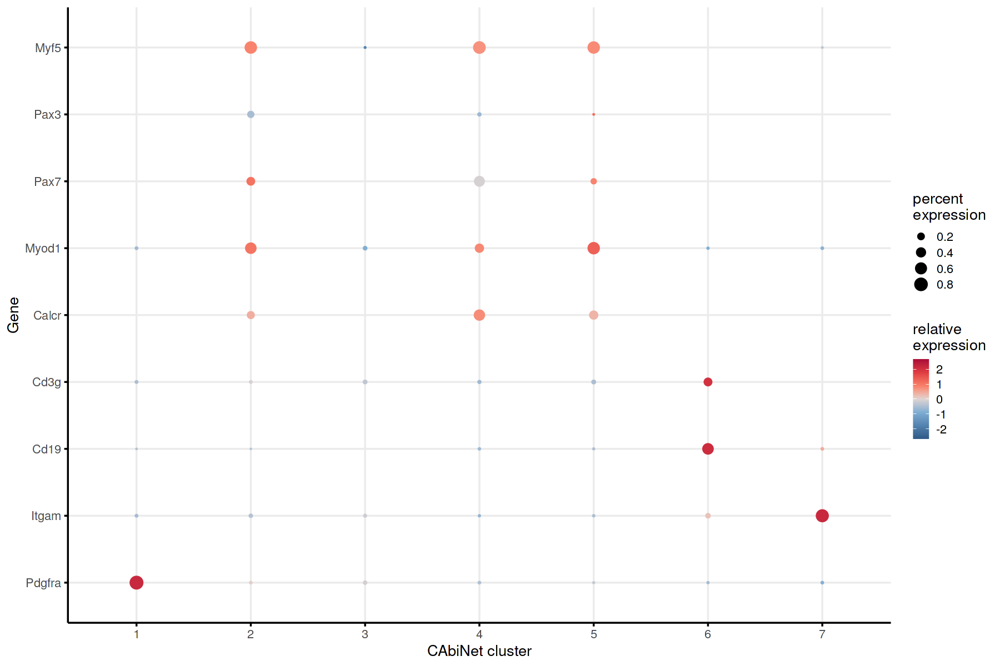

In [20]:
zsc <- logcounts(sce_sub[gois,])
zsc <- purrr::map_dfc(unique(sce_sub$cabinet_cluster), 
                      function(x) rowMeans(zsc[,sce_sub$cabinet_cluster == x]))
                      
colnames(zsc) <- unique(sce_sub$cabinet_cluster)
zsc <- as.matrix(zsc)
rownames(zsc) <- gois
zsc <- scale(zsc, center = T, scale = T)
limits <- max(abs(zsc), na.rm = TRUE) * c(1, -1)

dp <- dittoDotPlot(sce_sub,
             gois, 
             group.by = "cabinet_cluster") +
coord_flip() +
scale_colour_gradient2_tableau(name = "relative\nexpression",
                               "Red-Blue Diverging", 
                               limit = limits,
                               trans = "reverse",
                               guide = guide_colorbar(reverse = TRUE)) +
labs(x = "Gene",
     y = "CAbiNet cluster") +
theme_minimal(base_size = 16) +
theme(axis.line = element_line(),
     axis.ticks = element_line())

dp

#ggsave(plot = dp, 
#       filename = file.path(imgdir, "feature_dotplot_sfig1_panel_d.pdf"),
#       width = 2000,
#       height = 2000,
#       units = "px")

# Supplementary Figure 2

In [21]:
gois <- c("Pdgfra",
          "Itgam",
          "Cd19",
          "Cd3g",
          "Calcr",
          "Myod1",
          "Pax7",
          "Pax3",
          "Myf5")

logcnts <- SummarizedExperiment::assay(sce_sub, "logcounts")

min_cutoff <- as.numeric(quantile(map_dbl(gois, function(x) min(logcnts[x,])), 0.1))
max_cutoff <- as.numeric(quantile(map_dbl(gois, function(x) max(logcnts[x,])), 0.9))

set_breaks_3 = function(limits) {
     c(round(limits[1]), (round(limits[2])-round(limits[1]))/2, round(limits[2]))
}

In [22]:
plots <- list()

for (gene in gois){
    
    p <- plot_feature_biMAP(caclust = cabic,
                   sce = sce_sub, 
                   feature = gene,
                   assay = "logcounts",
                   label_size = 6) +
    viridis::scale_color_viridis(name="logcounts",
                                 discrete = FALSE,
                                 breaks = set_breaks_3,
                                 limits =c(floor(min_cutoff), round(max_cutoff)),
                                 oob=scales::squish) +
    theme_bw(base_size = 16) +
        labs(x="", y = "") +
    theme(legend.position = c(0.9, 0.2),     
          panel.background = element_rect(fill='transparent'), 
          plot.background = element_rect(fill='transparent', color=NA),
          legend.background = element_rect(fill='transparent'),
          axis.text.x = element_blank(),
          axis.text.y = element_blank(),
          axis.line = element_line(colour = "black"),
          panel.border = element_rect(colour = "black"),
          plot.margin = unit(c(2,6,2,2), "mm")

         ) 
    

    plots[[gene]] <- p
    
}


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


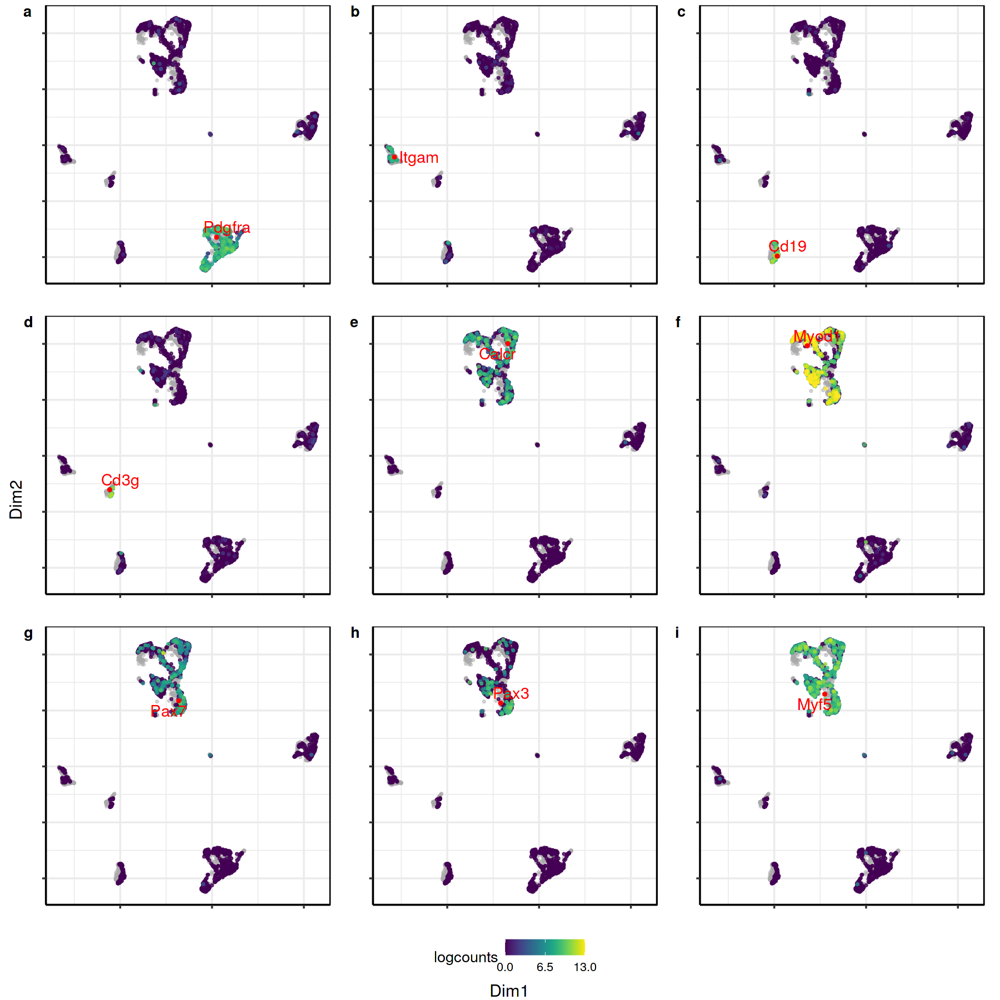

In [23]:
fig <- ggpubr::ggarrange(plotlist = plots, 
                  labels = letters[1:length(plots)],
                  font.label = list(size = 16, face = "bold"),
                  common.legend = TRUE,
                  legend = "bottom",
                  ncol = 3, nrow = 3)


fig <- ggpubr::annotate_figure(fig, 
                               left = textGrob("Dim2", rot = 90, vjust = 1, gp = gpar(cex = 1.5)),
                               bottom = textGrob("Dim1", gp = gpar(cex = 1.5)))

options(repr.plot.width = 15, repr.plot.height = 15)
fig
options(repr.plot.width = 15, repr.plot.height = 10)

#ggsave(plot = fig, 
#       filename = file.path(imgdir, "feature_panel_sfig3.pdf"),
#       width = 1000*3,
#       height = 1000*3,
#       units = "px")

# R environment

In [24]:
sessionInfo()

R version 4.2.1 (2022-06-23)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: MarIuX64 2.0 GNU/Linux

Matrix products: default
BLAS:   /pkg/R-4.2.1-0/lib/R/lib/libRblas.so
LAPACK: /pkg/R-4.2.1-0/lib/R/lib/libRlapack.so

locale:
 [1] LC_CTYPE=en_US.UTF-8 LC_NUMERIC=C         LC_TIME=C           
 [4] LC_COLLATE=C         LC_MONETARY=C        LC_MESSAGES=C       
 [7] LC_PAPER=C           LC_NAME=C            LC_ADDRESS=C        
[10] LC_TELEPHONE=C       LC_MEASUREMENT=C     LC_IDENTIFICATION=C 

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] dittoSeq_1.8.1              ggsankey_0.0.99999         
 [3] circlize_0.4.15             ComplexHeatmap_2.12.0      
 [5] ggthemes_4.2.4              ggrepel_0.9.2              
 [7] plotly_4.10.1               forcats_0.5.1              
 [9] stringr_1.5.0               dplyr_1.0.10               
[11] purrr_0.3.5                 readr_2.